#ICBHI Dataset

In [ ]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [15]:
import pandas as pd
import numpy as np
import os
from tqdm import tqdm_notebook as tqdm
from shutil import copyfile

import librosa
import librosa.display
import scipy.io.wavfile as wav

import IPython.display as ipd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torchaudio

# from transformers import AutoConfig, Wav2Vec2FeatureExtractor


In [ ]:
rootPath = 'drive/MyDrive/Tesi'

## Unzip dataset e divisione train/test

In [ ]:
rootPath = 'drive/MyDrive/Tesi'
!unzip -x $rootPath'/ICBHI_final_database.zip' 

Archive:  drive/MyDrive/Tesi/ICBHI_final_database.zip
   creating: ICBHI_final_database/
  inflating: ICBHI_final_database/101_1b1_Al_sc_Meditron.wav  
  inflating: ICBHI_final_database/103_2b2_Ar_mc_LittC2SE.wav  
  inflating: ICBHI_final_database/104_1b1_Al_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Al_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Ar_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Ll_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Lr_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Lr_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Pl_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Pr_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Pr_sc_Litt3200.wav  
  inflating: ICBHI_final_database/105_1b1_Tc_sc_Meditron.txt  
  inflating: ICBHI_final_database/105_1b1_Tc_sc_Meditron.wav  
  inflating: ICBHI_final_database/106_2b1_Pr_mc_LittC2SE.txt  
  inflating: ICBHI_final_data

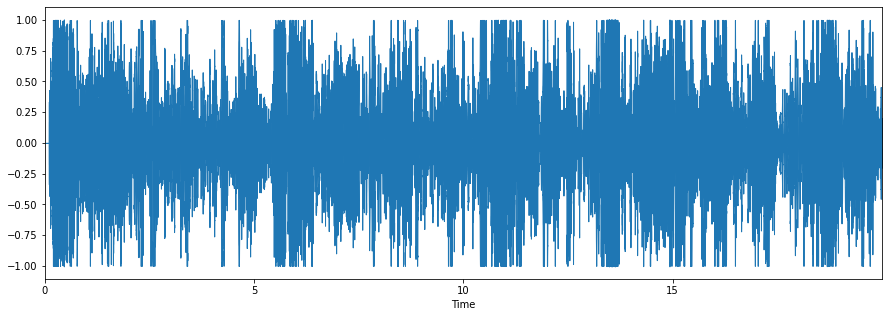

In [ ]:
import matplotlib.pyplot as plt
y, sr = librosa.load("ICBHI_final_database/107_2b3_Pl_mc_AKGC417L.wav")
plt.figure(figsize=(15,5))
librosa.display.waveplot(y, sr=sr)

In [ ]:
!ls $rootPath/'ICBHI_final_database'

In [ ]:
#c'è un errore su un file del dataset che non è stato rinominato con lo strumento di registrazione giusto

!mv $rootPath/'ICBHI_final_database'/226_1b1_Pl_sc_LittC2SE.txt $rootPath/'ICBHI_final_database'/226_1b1_Pl_sc_Meditron.txt
!mv $rootPath/'ICBHI_final_database'/226_1b1_Pl_sc_LittC2SE.wav $rootPath/'ICBHI_final_database'/226_1b1_Pl_sc_Meditron.wav

In [ ]:
import os
from shutil import copyfile
#splitting train/test
with open(os.path.join(rootPath, 'train-test_split.txt'),'r') as file:
  for line in file:
    name = line.split()[0]
    dest = line.split()[1]
    
    copyfile(os.path.join(rootPath,'ICBHI_final_database/'+name+'.wav'), os.path.join(rootPath, dest+'/'+name+'.wav'))
    copyfile(os.path.join(rootPath,'ICBHI_final_database/'+name+'.txt'), os.path.join(rootPath, dest+'/'+name+'.txt'))
    print(name, dest)

101_1b1_Al_sc_Meditron test
101_1b1_Pr_sc_Meditron test
102_1b1_Ar_sc_Meditron test
103_2b2_Ar_mc_LittC2SE train
104_1b1_Al_sc_Litt3200 test
104_1b1_Ar_sc_Litt3200 test
104_1b1_Ll_sc_Litt3200 test
104_1b1_Lr_sc_Litt3200 test
104_1b1_Pl_sc_Litt3200 test
104_1b1_Pr_sc_Litt3200 test
105_1b1_Tc_sc_Meditron train
106_2b1_Pl_mc_LittC2SE train
106_2b1_Pr_mc_LittC2SE train
107_2b3_Al_mc_AKGC417L train
107_2b3_Ar_mc_AKGC417L train
107_2b3_Ll_mc_AKGC417L train
107_2b3_Lr_mc_AKGC417L train
107_2b3_Pl_mc_AKGC417L train
107_2b3_Pr_mc_AKGC417L train
107_2b3_Tc_mc_AKGC417L train
107_2b4_Al_mc_AKGC417L train
107_2b4_Ar_mc_AKGC417L train
107_2b4_Ll_mc_AKGC417L train
107_2b4_Lr_mc_AKGC417L train
107_2b4_Pl_mc_AKGC417L train
107_2b4_Pr_mc_AKGC417L train
107_2b4_Tc_mc_AKGC417L train
107_2b5_Al_mc_AKGC417L train
107_2b5_Ar_mc_AKGC417L train
107_2b5_Ll_mc_AKGC417L train
107_2b5_Lr_mc_AKGC417L train
107_2b5_Pl_mc_AKGC417L train
107_2b5_Pr_mc_AKGC417L train
107_2b5_Tc_mc_AKGC417L train
107_3p2_Al_mc_AKGC417L 

## Data Exploration

In [ ]:
ipd.Audio("/content/drive/MyDrive/Tesi/train/213_2p2_Ar_mc_AKGC417L.wav")

Queste sono le annotazioni dei cicli respiratori dell'auscultazione. I cicli respiratori vanno dall'inizio dell'inspirazione alla fine dell'espirazione.

Gli indici indicano il primo la presenza/assenza di crackles, il secondo la presenza/assenza di wheezels.

In [ ]:
path = "/content/drive/MyDrive/Tesi/train/213_2p2_Ar_mc_AKGC417L.txt"
!cat $path

0.86	3.631	1	0
3.631	6.486	0	0
6.486	9.157	0	0
9.157	12.062	0	0
12.062	14.533	0	0
14.533	17.104	0	0
17.104	19.708	0	0


## Creazione Dataset cicli respiratori

In [ ]:
!pip install pydub

  Using cached pydub-0.25.1-py2.py3-none-any.whl (32 kB)


In [ ]:
#splitting audio file
from pydub import AudioSegment
def split_audio(filepath, t1, t2):
  t1 = t1 * 1000 #Works in milliseconds
  t2 = t2 * 1000
  newAudio = AudioSegment.from_wav(filepath)
  newAudio = newAudio[t1:t2]
  return newAudio
  # newAudio.export('newSong.wav', format="wav")

In [ ]:
#rc = Respiratory Cycle
df_rc_1 = pd.DataFrame(columns=['filename', 'crackle', 'wheeze'])
df_rc_1

,filename,crackle,wheeze


In [ ]:
!rm -r '/content/drive/MyDrive/Tesi/dataset_cicli_respiratori'

In [ ]:
ipd.Audio('/content/drive/MyDrive/Tesi/dataset_cicli_respiratori/107_2b3_Ar_mc_AKGC417L_6.wav')

#### lavoriamo nella virtual machine di Colab, invece di prelevare i file da drive

In [ ]:
!unzip -x $'/content/drive/MyDrive/Tesi/ICBHI_final_database.zip'

Archive:  /content/drive/MyDrive/Tesi/ICBHI_final_database.zip
   creating: ICBHI_final_database/
  inflating: ICBHI_final_database/101_1b1_Al_sc_Meditron.wav  
  inflating: ICBHI_final_database/103_2b2_Ar_mc_LittC2SE.wav  
  inflating: ICBHI_final_database/104_1b1_Al_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Al_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Ar_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Ll_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Lr_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Lr_sc_Litt3200.wav  
  inflating: ICBHI_final_database/104_1b1_Pl_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Pr_sc_Litt3200.txt  
  inflating: ICBHI_final_database/104_1b1_Pr_sc_Litt3200.wav  
  inflating: ICBHI_final_database/105_1b1_Tc_sc_Meditron.txt  
  inflating: ICBHI_final_database/105_1b1_Tc_sc_Meditron.wav  
  inflating: ICBHI_final_database/106_2b1_Pr_mc_LittC2SE.txt  
  inflating: ICBHI_f

In [ ]:
#c'è un errore su un file del dataset che non è stato rinominato con lo strumento di registrazione giusto

!mv 'ICBHI_final_database'/226_1b1_Pl_sc_LittC2SE.txt 'ICBHI_final_database'/226_1b1_Pl_sc_Meditron.txt
!mv 'ICBHI_final_database'/226_1b1_Pl_sc_LittC2SE.wav 'ICBHI_final_database'/226_1b1_Pl_sc_Meditron.wav

In [ ]:
# directory = r'/content/ICBHI_final_database'
# filename = '157_1b1_Pr_sc_Meditron.wav'
# df = pd.DataFrame(columns=['filename', 'crackle', 'wheeze'])
# with open(os.path.join(directory, filename.replace('.wav','.txt')),'r') as file:
#   for num_split, line in enumerate(file):
#     entry = line.split('\t')
#     # print(float(entry[1])-float(entry[0]))
#     audio_tmp = split_audio(os.path.join(directory,filename), float(entry[0]), float(entry[1]))
#     filename2 = filename.replace('.wav','_'+str(num_split))
#     audio_tmp.export('/content/prova/'+filename2+'.wav', format='wav')
#     df = df.append({'filename':filename2, 'crackle': entry[2], 'wheeze': entry[3].replace('\n','')}, ignore_index=True)


In [ ]:
df

In [ ]:
#Creazione dataset cicli respiratori
directory = r'/content/ICBHI_final_database'
for filename in tqdm(os.listdir(directory)):
    if filename.endswith(".wav"):# or filename.endswith(".png"):
      with open(os.path.join(directory, filename.replace('.wav','.txt')),'r') as file:
        for num_split, line in enumerate(file):
          entry = line.split('\t')
          #entry[0]=t1, entry[1]=t2, entry[2]=presence of crackles, entry[3].replace('\n','')=presence of wheezels
          audio_tmp = split_audio(os.path.join(directory,filename), float(entry[0]), float(entry[1]))
          filename2 = filename.replace('.wav','_'+str(num_split))
          audio_tmp.export('/content/dataset_cicli_respiratori/'+filename2+'.wav', format='wav')
          df_rc1 = df_rc1.append({'filename':filename2, 'crackle': entry[2], 'wheeze': entry[3].replace('\n','')}, ignore_index=True)
      # break
    else:
        continue


In [ ]:
#zippiamo la cartella per poi copiarla su drive
!zip -r dataset_cicli_respiratori.zip dataset_cicli_respiratori/

In [ ]:
df_rc1.head()

In [ ]:
df_rc1.to_csv(r'/content/drive/MyDrive/Tesi/dataset_rc.csv', index=False)

## Creazione dataset cicli respiratori - Data Augmentation (Healthy/Unhealthy)

In [5]:
df_rc = pd.read_csv('/content/drive/MyDrive/Tesi Antonio Gagliostro/Altri esperimenti/dataset_rc.csv')
df_rc

,filename,label
0,101_1b1_Al_sc_Meditron_0,none
1,101_1b1_Al_sc_Meditron_1,none
2,101_1b1_Al_sc_Meditron_10,none
3,101_1b1_Al_sc_Meditron_11,none
4,101_1b1_Al_sc_Meditron_2,none
...,...,...
6893,226_1b1_Pl_sc_Meditron_5,crackle
6894,226_1b1_Pl_sc_Meditron_6,crackle
6895,226_1b1_Pl_sc_Meditron_7,none
6896,226_1b1_Pl_sc_Meditron_8,none


In [6]:
df_rc.groupby('label').count()

,filename
label,
both,506
crackle,1864
none,3642
wheeze,886


In [8]:
#extract with 7zip and progressbar to VM Colab
!7z x /content/drive/MyDrive/Tesi' 'Antonio' 'Gagliostro/Dati/ICBHI/Respiratory' 'cycle' 'dataset/dataset_cicli_respiratori.zip -o/content/


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/Tesi Anto . /ICBHI/Respiratory cycle dataset/                                                                              1 file, 2090629544 bytes (1994 MiB)

Extracting archive: /content/drive/MyDrive/Tesi Antonio Gagliostro/Dati/ICBHI/Respiratory cycle dataset/dataset_cicli_respiratori.zip
 59% 4096 Open              --
Path = /content/drive/MyDrive/Tesi Antonio Gagliostro/Dati/ICBHI/Respiratory cycle dataset/dataset_cicli_respiratori.zip
Type = zip
Physical Size = 2090629544

  0%      0% 18 - dataset_cicli_respiratori/112_1p1_Ll_sc_L

In [9]:
df_binary = df_rc.copy()
# df_binary['label'] = (df_rc['label']!= ('crackle' or 'wheeze' or 'both'))*1
df_binary['label'] = (df_rc['label'] =='none')*1
df_binary['filename']="/content/dataset_cicli_respiratori/"+df_binary['filename']+'.wav'
df_binary

,filename,label
0,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
1,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
2,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
3,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
4,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
...,...,...
6893,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0
6894,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0
6895,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1
6896,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1


In [10]:
df_binary.groupby('label').count()

,filename
label,
0,3256
1,3642


In [11]:
df_healthy = df_binary[df_binary['label']==1]
df_healthy

,filename,label
0,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
1,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
2,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
3,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
4,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
...,...,...
6888,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1
6889,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1
6892,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1
6895,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1


In [12]:
df_unhealthy = df_binary[df_binary['label']==0]
df_unhealthy

,filename,label
36,/content/dataset_cicli_respiratori/103_2b2_Ar_...,0
38,/content/dataset_cicli_respiratori/103_2b2_Ar_...,0
39,/content/dataset_cicli_respiratori/103_2b2_Ar_...,0
40,/content/dataset_cicli_respiratori/103_2b2_Ar_...,0
48,/content/dataset_cicli_respiratori/104_1b1_Ar_...,0
...,...,...
6890,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0
6891,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0
6893,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0
6894,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0


In [16]:
path = '/content/dataset_cicli_respiratori/'+df_rc['filename'].iloc[3549]+'.wav'
audio, sr = torchaudio.load(path)
path

'/content/dataset_cicli_respiratori/162_2b4_Pl_mc_AKGC417L_3.wav'

In [17]:
!7z x /content/drive/MyDrive/Tesi' 'Antonio' 'Gagliostro/Dati/free-sound/free-sound.zip -o/content/


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/Tesi Antonio Gagliostro/Dati/free-sound/                                                                         1 file, 562268693 bytes (537 MiB)

Extracting archive: /content/drive/MyDrive/Tesi Antonio Gagliostro/Dati/free-sound/free-sound.zip
--
Path = /content/drive/MyDrive/Tesi Antonio Gagliostro/Dati/free-sound/free-sound.zip
Type = zip
Physical Size = 562268693

  0%      0% 7 - free-sound/noise-free-sound-0004.wav                                               1% 15 - free-sound/n

##### Background noise

In [18]:
import math
import os
import pathlib
import random
import torch

class RandomBackgroundNoise:
    def __init__(self, sample_rate, noise_dir, min_snr_db=0, max_snr_db=15):
        self.sample_rate = sample_rate
        self.min_snr_db = min_snr_db
        self.max_snr_db = max_snr_db

        if not os.path.exists(noise_dir):
            raise IOError(f'Noise directory `{noise_dir}` does not exist')
        # find all WAV files including in sub-folders:
        self.noise_files_list = list(pathlib.Path(noise_dir).glob('**/*.wav'))
        if len(self.noise_files_list) == 0:
            raise IOError(f'No .wav file found in the noise directory `{noise_dir}`')

    def __call__(self, audio_data):
        random_noise_file = random.choice(self.noise_files_list)
        effects = [
            ['remix', '1'], # convert to mono
            ['rate', str(self.sample_rate)], # resample
        ]
        noise, _ = torchaudio.sox_effects.apply_effects_file(random_noise_file, effects, normalize=True)
        audio_length = audio_data.shape[-1]
        noise_length = noise.shape[-1]
        if noise_length > audio_length:
            offset = random.randint(0, noise_length-audio_length)
            noise = noise[..., offset:offset+audio_length]
        elif noise_length < audio_length:
            noise = torch.cat([noise, torch.zeros((noise.shape[0], audio_length-noise_length))], dim=-1)

        snr_db = random.randint(self.min_snr_db, self.max_snr_db)
        # snr_db = self.min_snr_db
        snr = math.exp(snr_db / 10)
        audio_power = audio_data.norm(p=2)
        noise_power = noise.norm(p=2)
        scale = snr * noise_power / audio_power

        return (audio_data + noise*0.1 ) / 2
 
noise_transform = RandomBackgroundNoise(sr, '/content/free-sound')
transformed_audio = noise_transform(audio)

In [19]:
# add_noise(path)
# prova, _ = torchaudio.load('prova.wav')
# ipd.Audio(data=np.asarray(prova), autoplay=True, rate=16000)

In [20]:
ipd.Audio(data=np.asarray(transformed_audio), autoplay=True, rate=sr)

In [21]:
import IPython.display as ipd

ipd.Audio(data=np.asarray(audio), autoplay=True, rate=sr)

In [22]:
audio.shape[1]/sr

1.68

##### Change speed

In [23]:
import random

class SpeedChange:
    def __init__(self, sample_rate):
        self.sample_rate = sample_rate

    def __call__(self, audio_data):
        speed_factor = 0.5 if (audio_data.shape[1]/self.sample_rate)<=8 else 1.5#random.choice([0.9, 1.0, 1.1])
        # if speed_factor == 1.0: # no change
        #     return audio_data

        # change speed and resample to original rate:
        sox_effects = [
            ["speed", str(speed_factor)],
            ["rate", str(self.sample_rate)],
        ]
        transformed_audio, _ = torchaudio.sox_effects.apply_effects_tensor(
            audio_data, self.sample_rate, sox_effects)
        return transformed_audio
 
speed_transform = SpeedChange(sr)
transformed_audio = speed_transform(audio)

In [24]:
torchaudio.save('/content/prova.wav', transformed_audio, sr)

In [25]:
ipd.Audio(data=np.asarray(transformed_audio), autoplay=True, rate=sr)

In [26]:
import IPython.display as ipd

ipd.Audio(data=np.asarray(audio), autoplay=True, rate=sr)

##### change Speed 2


In [27]:
import random

class SpeedChange2:
    def __init__(self, sample_rate):
        self.sample_rate = sample_rate

    def __call__(self, audio_data, duration_target):
        speed_factor = (audio_data.shape[1]/self.sample_rate)/duration_target
        #0.5 if (audio_data.shape[1]/self.sample_rate)<=8 else 1.5#random.choice([0.9, 1.0, 1.1])
        # if speed_factor == 1.0: # no change
        #     return audio_data

        # change speed and resample to original rate:
        sox_effects = [
            ["speed", str(speed_factor)],
            ["rate", str(self.sample_rate)],
        ]
        transformed_audio, _ = torchaudio.sox_effects.apply_effects_tensor(
            audio_data, self.sample_rate, sox_effects)
        return transformed_audio
 
speed_transform = SpeedChange2(sr)
transformed_audio = speed_transform(audio, 3)

In [28]:
torchaudio.save('/content/prova.wav', transformed_audio, sr)

In [29]:
ipd.Audio(data=np.asarray(transformed_audio), autoplay=True, rate=sr)

In [30]:
import IPython.display as ipd

ipd.Audio(data=np.asarray(audio), autoplay=True, rate=sr)

In [31]:
df_rc

,filename,label
0,101_1b1_Al_sc_Meditron_0,none
1,101_1b1_Al_sc_Meditron_1,none
2,101_1b1_Al_sc_Meditron_10,none
3,101_1b1_Al_sc_Meditron_11,none
4,101_1b1_Al_sc_Meditron_2,none
...,...,...
6893,226_1b1_Pl_sc_Meditron_5,crackle
6894,226_1b1_Pl_sc_Meditron_6,crackle
6895,226_1b1_Pl_sc_Meditron_7,none
6896,226_1b1_Pl_sc_Meditron_8,none


##### speed+noise

In [35]:
class ComposeTransform:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, audio_data):
        for t in self.transforms:
            audio_data = t(audio_data)
        return audio_data

compose_transform = ComposeTransform([
    SpeedChange(sr),
    RandomBackgroundNoise(sr, '/content/free-sound')])

transformed_audio = compose_transform(audio)

In [36]:
ipd.Audio(data=np.asarray(transformed_audio), autoplay=True, rate=sr)

##### Creazione dataset Healthy/Unhealthy Augmented
Campioniamo 
- 2000 sample random per aggiungere rumore (1000 healthy, 1000 unhealthy)
- 2000 sample random per modificare la velocità (1000 healthy, 1000 unhealthy)
- 2000 sample random per aggiungere rumore e modificare la velocità (1000 healthy, 1000 unhealthy)

In [38]:
#3000 healthy
df_index_list = np.arange(df_healthy.shape[0])
random_list = random.sample(list(df_index_list), 3000)
count=0
df_healthy_augmented = pd.DataFrame(columns=['filename', 'label'])
for elem in random_list:
  audio, sr = torchaudio.load(df_healthy['filename'].iloc[elem])
  if count<1000:
    noise_transform = RandomBackgroundNoise(sr, '/content/free-sound')
    transformed_audio = noise_transform(audio)
    path = df_healthy['filename'].iloc[elem].replace('.wav', '_augmented.wav')
    path = path.replace('dataset_cicli_respiratori', 'augmented_sample')
    torchaudio.save(path, transformed_audio, sr)
    df_healthy_augmented = df_healthy_augmented.append({'filename':path, 'label': df_healthy['label'].iloc[elem]}, ignore_index=True)
  elif count>=1000 and count<2000:
    speed_transform = SpeedChange(sr)
    transformed_audio = speed_transform(audio)
    path = df_healthy['filename'].iloc[elem].replace('.wav', '_augmented.wav')
    path = path.replace('dataset_cicli_respiratori', 'augmented_sample')
    torchaudio.save(path, transformed_audio, sr)
    df_healthy_augmented = df_healthy_augmented.append({'filename':path, 'label': df_healthy['label'].iloc[elem]}, ignore_index=True)
  elif count>=2000 and count<3000:
    compose_transform = ComposeTransform([
        SpeedChange(sr),
        RandomBackgroundNoise(sr, '/content/free-sound')])

    transformed_audio = compose_transform(audio)
    path = df_healthy['filename'].iloc[elem].replace('.wav', '_augmented.wav')
    path = path.replace('dataset_cicli_respiratori', 'augmented_sample')
    torchaudio.save(path, transformed_audio, sr)
    df_healthy_augmented = df_healthy_augmented.append({'filename':path, 'label': df_healthy['label'].iloc[elem]}, ignore_index=True)
  count = count+1

In [39]:
#3000 unhealthy
df_index_list = np.arange(df_unhealthy.shape[0])
random_list = random.sample(list(df_index_list), 3000)
count=0
df_unhealthy_augmented = pd.DataFrame(columns=['filename', 'label'])
for elem in random_list:
  audio, sr = torchaudio.load(df_unhealthy['filename'].iloc[elem])
  if count<1000:
    noise_transform = RandomBackgroundNoise(sr, '/content/free-sound')
    transformed_audio = noise_transform(audio)
    path = df_unhealthy['filename'].iloc[elem].replace('.wav', '_augmented.wav')
    path = path.replace('dataset_cicli_respiratori', 'augmented_sample')
    torchaudio.save(path, transformed_audio, sr)
    df_unhealthy_augmented = df_unhealthy_augmented.append({'filename':path, 'label': df_unhealthy['label'].iloc[elem]}, ignore_index=True)
  elif count>=1000 and count<2000:
    speed_transform = SpeedChange(sr)
    transformed_audio = speed_transform(audio)
    path = df_unhealthy['filename'].iloc[elem].replace('.wav', '_augmented.wav')
    path = path.replace('dataset_cicli_respiratori', 'augmented_sample')
    torchaudio.save(path, transformed_audio, sr)
    df_unhealthy_augmented = df_unhealthy_augmented.append({'filename':path, 'label': df_unhealthy['label'].iloc[elem]}, ignore_index=True)
  elif count>=2000 and count<3000:
    compose_transform = ComposeTransform([
        SpeedChange(sr),
        RandomBackgroundNoise(sr, '/content/free-sound')])

    transformed_audio = compose_transform(audio)
    path = df_unhealthy['filename'].iloc[elem].replace('.wav', '_augmented.wav')
    path = path.replace('dataset_cicli_respiratori', 'augmented_sample')
    torchaudio.save(path, transformed_audio, sr)
    df_unhealthy_augmented = df_unhealthy_augmented.append({'filename':path, 'label': df_unhealthy['label'].iloc[elem]}, ignore_index=True)
  count = count+1

In [40]:
df_healthy_augmented

,filename,label
0,/content/augmented_sample/166_1p1_Ar_sc_Meditr...,1
1,/content/augmented_sample/159_1b1_Ar_sc_Meditr...,1
2,/content/augmented_sample/159_1b1_Ar_sc_Meditr...,1
3,/content/augmented_sample/104_1b1_Pl_sc_Litt32...,1
4,/content/augmented_sample/200_2p4_Pl_mc_AKGC41...,1
...,...,...
2995,/content/augmented_sample/218_1b1_Lr_sc_Meditr...,1
2996,/content/augmented_sample/204_2b5_Ll_mc_AKGC41...,1
2997,/content/augmented_sample/194_1b1_Pr_sc_Meditr...,1
2998,/content/augmented_sample/203_1p2_Tc_mc_AKGC41...,1


In [41]:
df_unhealthy_augmented

,filename,label
0,/content/augmented_sample/130_2p5_Al_mc_AKGC41...,0
1,/content/augmented_sample/156_2b3_Pl_mc_AKGC41...,0
2,/content/augmented_sample/176_2b3_Pr_mc_AKGC41...,0
3,/content/augmented_sample/174_1p2_Ar_mc_AKGC41...,0
4,/content/augmented_sample/130_3p2_Pl_mc_AKGC41...,0
...,...,...
2995,/content/augmented_sample/163_2b2_Pl_mc_AKGC41...,0
2996,/content/augmented_sample/178_1b2_Pl_mc_AKGC41...,0
2997,/content/augmented_sample/116_1b2_Pl_sc_Meditr...,0
2998,/content/augmented_sample/193_7b3_Tc_mc_AKGC41...,0


In [42]:
df_binary

,filename,label
0,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
1,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
2,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
3,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
4,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
...,...,...
6893,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0
6894,/content/dataset_cicli_respiratori/226_1b1_Pl_...,0
6895,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1
6896,/content/dataset_cicli_respiratori/226_1b1_Pl_...,1


In [43]:
!zip -r /content/drive/MyDrive/Tesi' 'Antonio' 'Gagliostro/Dati/ICBHI/Respiratory' 'cycle' 'dataset/augmented_sample.zip augmented_sample/

Output streaming troncato alle ultime 5000 righe.
  adding: augmented_sample/212_2b2_Tc_mc_LittC2SE_5_augmented.wav (deflated 20%)
  adding: augmented_sample/158_1p3_Al_mc_AKGC417L_6_augmented.wav (deflated 12%)
  adding: augmented_sample/103_2b2_Ar_mc_LittC2SE_4_augmented.wav (deflated 14%)
  adding: augmented_sample/122_2b2_Ar_mc_LittC2SE_4_augmented.wav (deflated 16%)
  adding: augmented_sample/107_2b3_Al_mc_AKGC417L_7_augmented.wav (deflated 12%)
  adding: augmented_sample/203_1p3_Ar_mc_AKGC417L_0_augmented.wav (deflated 12%)
  adding: augmented_sample/205_2b2_Pr_mc_AKGC417L_1_augmented.wav (deflated 17%)
  adding: augmented_sample/163_8b3_Pl_mc_AKGC417L_0_augmented.wav (deflated 24%)
  adding: augmented_sample/120_1b1_Lr_sc_Meditron_23_augmented.wav (deflated 14%)
  adding: augmented_sample/162_2b4_Al_mc_AKGC417L_2_augmented.wav (deflated 12%)
  adding: augmented_sample/193_1b2_Tc_mc_AKGC417L_4_augmented.wav (deflated 16%)
  adding: augmented_sample/120_1b1_Pl_sc_Meditron_11_augme

In [ ]:
random_list = random.sample(list(df_index_list), 6000)

In [45]:
df_binary_augmented = pd.concat([df_binary, df_healthy_augmented, df_unhealthy_augmented], ignore_index=True)
df_binary_augmented

,filename,label
0,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
1,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
2,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
3,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
4,/content/dataset_cicli_respiratori/101_1b1_Al_...,1
...,...,...
12893,/content/augmented_sample/163_2b2_Pl_mc_AKGC41...,0
12894,/content/augmented_sample/178_1b2_Pl_mc_AKGC41...,0
12895,/content/augmented_sample/116_1b2_Pl_sc_Meditr...,0
12896,/content/augmented_sample/193_7b3_Tc_mc_AKGC41...,0


In [46]:
df_binary_augmented.to_csv(r'/content/drive/MyDrive/Tesi Antonio Gagliostro/Codice/Config/dataset_binary_augmented.csv', index=False)

### Band-pass filter


In [ ]:
!pip3 install torch==1.10.0+cu113 torchvision==0.11.1+cu113 torchaudio===0.10.0+cu113 -f https://download.pytorch.org/whl/cu113/torch_stable.html

Looking in links: https://download.pytorch.org/whl/cu113/torch_stable.html
     |██████████████▋                 | 834.1 MB 1.4 MB/s eta 0:11:46tcmalloc: large alloc 1147494400 bytes == 0x55afd1518000 @  0x7f3f1400a615 0x55af98d0b4cc 0x55af98deb47a 0x55af98d0e2ed 0x55af98dffe1d 0x55af98d81e99 0x55af98d7c9ee 0x55af98d0fbda 0x55af98d81d00 0x55af98d7c9ee 0x55af98d0fbda 0x55af98d7e737 0x55af98e00c66 0x55af98d7ddaf 0x55af98e00c66 0x55af98d7ddaf 0x55af98e00c66 0x55af98d7ddaf 0x55af98d10039 0x55af98d53409 0x55af98d0ec52 0x55af98d81c25 0x55af98d7c9ee 0x55af98d0fbda 0x55af98d7e737 0x55af98d7c9ee 0x55af98d0fbda 0x55af98d7d915 0x55af98d0fafa 0x55af98d7dc0d 0x55af98d7c9ee
     |██████████████████▌             | 1055.7 MB 1.6 MB/s eta 0:08:01tcmalloc: large alloc 1434370048 bytes == 0x55b015b6e000 @  0x7f3f1400a615 0x55af98d0b4cc 0x55af98deb47a 0x55af98d0e2ed 0x55af98dffe1d 0x55af98d81e99 0x55af98d7c9ee 0x55af98d0fbda 0x55af98d81d00 0x55af98d7c9ee 0x55af98d0fbda 0x55af98d7e737 0x55af98e00c66 0x55af

In [ ]:
!pip install torchaudio
import torchaudio

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Tesi/dataset_rc.csv')
df.head()

,filename,label
0,101_1b1_Al_sc_Meditron_0,none
1,101_1b1_Al_sc_Meditron_1,none
2,101_1b1_Al_sc_Meditron_10,none
3,101_1b1_Al_sc_Meditron_11,none
4,101_1b1_Al_sc_Meditron_2,none


In [ ]:
!7z x /content/drive/MyDrive/Tesi/dataset_cicli_respiratori.zip -o/content/


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/Tesi/                                      1 file, 2090629544 bytes (1994 MiB)

Extracting archive: /content/drive/MyDrive/Tesi/dataset_cicli_respiratori.zip
 59% 4096 Open              --
Path = /content/drive/MyDrive/Tesi/dataset_cicli_respiratori.zip
Type = zip
Physical Size = 2090629544

  0%      0% 20 - dataset_cicli_respiratori/160_1b2_Pl_mc_AKGC417L_1.wav                                                                  0% 41 - dataset_cicli_respiratori/163_2b2_Al_mc_AKGC417L_1.wav

## Creazione dataset HF_Lung_V1 con filtro passa-banda


In [ ]:
!rm -r /content/test
!rm -r /content/train
!rm -r /content/test_bandPass
!rm -r /content/train_bandPass

In [ ]:
!mkdir /content/test_bandPass
!mkdir /content/train_bandPass
!unzip -x $'/content/drive/MyDrive/Tesi/test-HF_Lung_V1.zip' -d /content/
!unzip -x $'/content/drive/MyDrive/Tesi/train-HF_Lung_V1.zip' -d /content/

Output streaming troncato alle ultime 5000 righe.
  inflating: /content/train/trunc_2019-06-13-11-32-14-L4_5_label.txt  
  inflating: /content/train/steth_20190630_11_40_38_label.txt  
  inflating: /content/train/trunc_2019-05-16-15-53-58-L2_6_label.txt  
  inflating: /content/train/trunc_2019-06-30-11-43-25-L1_14.wav  
  inflating: /content/train/trunc_2019-06-13-11-32-14-L2_1_label.txt  
  inflating: /content/train/trunc_2019-05-07-16-04-05-L1_12_label.txt  
  inflating: /content/train/trunc_2019-05-07-15-00-52-L6_1.wav  
  inflating: /content/train/trunc_2019-07-17-10-07-09-L5_4.wav  
  inflating: /content/train/trunc_2019-07-17-11-08-44-L2_7_label.txt  
  inflating: /content/train/trunc_2019-07-28-11-08-24-L5_11.wav  
  inflating: /content/train/trunc_2019-07-28-11-41-44-L5_3.wav  
  inflating: /content/train/steth_20181022_09_37_03.wav  
  inflating: /content/train/steth_20190626_10_47_00.wav  
  inflating: /content/train/trunc_2019-05-31-15-38-07-L1_4.wav  
  inflating: /content/

In [ ]:
from scipy.signal import butter, lfilter
from scipy.signal import freqz

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

In [ ]:
# import threading 
# from threading import * 
import soundfile as sf
import os

def new_dataset_bandPass(path):
  # df_bandPass = pd.DataFrame(columns=['filename'])
  
  for filename in tqdm(os.listdir(path)):
    if filename.endswith(".wav"): 
      
      audio, sr = librosa.load(path+'/'+filename)
      audio = librosa.resample(audio, sr, 4000)
      # Sample rate and desired cutoff frequencies (in Hz).
      fs = sr
      lowcut = 120.0
      highcut = 1800.0

      y = butter_bandpass_filter(audio, lowcut, highcut, 4000, order=7)
      # print(path+'_bandPass/'+filename)
      # break
      sf.write(path+'_bandPass/'+filename, y, 4000)
      # df_bandPass = df_bandPass.append({'filename':path, 'label': label}, ignore_index=True)
    # return df_bandPass

In [ ]:
# df_binary = pd.read_csv('/content/drive/MyDrive/Tesi/df_binary.csv')
new_dataset_bandPass("/content/test")
new_dataset_bandPass("/content/train")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|          | 0/3912 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|          | 0/15618 [00:00<?, ?it/s]

In [ ]:
!ls -a train_bandPass

In [ ]:
!zip -r drive/MyDrive/Tesi/train_bandPass4khz_hf-lung.zip train_bandPass/
!zip -r drive/MyDrive/Tesi/test_bandPass4khz_hf-lung.zip test_bandPass/

Output streaming troncato alle ultime 5000 righe.
  adding: train_bandPass/steth_20181219_08_39_16.wav (deflated 24%)
  adding: train_bandPass/trunc_2019-06-30-10-08-35-L2_4.wav (deflated 23%)
  adding: train_bandPass/trunc_2019-07-31-10-50-18-L5_4.wav (deflated 26%)
  adding: train_bandPass/steth_20190717_10_09_29.wav (deflated 26%)
  adding: train_bandPass/steth_20190516_16_27_08.wav (deflated 16%)
  adding: train_bandPass/steth_20190613_11_56_54.wav (deflated 21%)
  adding: train_bandPass/steth_20181110_17_29_54.wav (deflated 21%)
  adding: train_bandPass/steth_20190728_12_05_26.wav (deflated 20%)
  adding: train_bandPass/trunc_2019-05-07-16-04-05-L2_5.wav (deflated 18%)
  adding: train_bandPass/trunc_2019-05-07-15-32-30-L6_6.wav (deflated 28%)
  adding: train_bandPass/trunc_2019-05-07-16-03-02-L4_7.wav (deflated 21%)
  adding: train_bandPass/steth_20190123_08_38_42.wav (deflated 27%)
  adding: train_bandPass/trunc_2019-05-31-15-38-07-L6_10.wav (deflated 21%)
  adding: train_bandPas

In [ ]:
# train_bandPass.to_csv(r'/content/drive/MyDrive/Tesi/train_bandPass_hf-lung.csv', index=False)

## Creazione dataset ICBHI anomaly con filtro passa-banda

In [ ]:
!unzip /content/drive/MyDrive/Tesi/dataset_bandPass2.zip

Output streaming troncato alle ultime 5000 righe.
  inflating: dataset_bandPass2/218_1b1_Lr_sc_Meditron_8_bandPass2.wav  
  inflating: dataset_bandPass2/156_8b3_Al_mc_AKGC417L_3_bandPass2.wav  
  inflating: dataset_bandPass2/110_1p1_Al_sc_Meditron_5_bandPass2.wav  
  inflating: dataset_bandPass2/176_2b3_Ll_mc_AKGC417L_6_bandPass2.wav  
  inflating: dataset_bandPass2/146_8p3_Pl_mc_AKGC417L_5_bandPass2.wav  
  inflating: dataset_bandPass2/132_2b1_Lr_mc_LittC2SE_2_bandPass2.wav  
  inflating: dataset_bandPass2/107_3p2_Tc_mc_AKGC417L_2_bandPass2.wav  
  inflating: dataset_bandPass2/226_1b1_Ll_sc_Meditron_0_bandPass2.wav  
  inflating: dataset_bandPass2/107_2b4_Tc_mc_AKGC417L_0_bandPass2.wav  
  inflating: dataset_bandPass2/207_2b2_Pl_mc_AKGC417L_2_bandPass2.wav  
  inflating: dataset_bandPass2/154_4b4_Pr_mc_AKGC417L_5_bandPass2.wav  
  inflating: dataset_bandPass2/193_1b2_Ll_mc_AKGC417L_6_bandPass2.wav  
  inflating: dataset_bandPass2/109_1b1_Lr_sc_Litt3200_7_bandPass2.wav  
  inflating: d

In [ ]:
# path = "/content/dataset_cicli_respiratori/" + df['filename'][300] + ".wav" #1658
audio, sr = librosa.load('dataset_bandPass2/181_1b3_Tc_mc_LittC2SE_3_bandPass2.wav')
ipd.Audio(data=audio, rate=sr, autoplay=False)

In [ ]:
sr

22050

In [ ]:
np.asarray(audio)

array([-3.0517578e-05, -3.0517578e-05, -3.0517578e-05, ...,
       -3.7536621e-03, -4.4555664e-03, -4.9438477e-03], dtype=float32)

In [ ]:
from scipy.signal import butter, lfilter
from scipy.signal import freqz


def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


# Sample rate and desired cutoff frequencies (in Hz).
fs = sr
lowcut = 120.0
highcut = 1800.0

y = butter_bandpass_filter(audio, lowcut, highcut, fs, order=7)

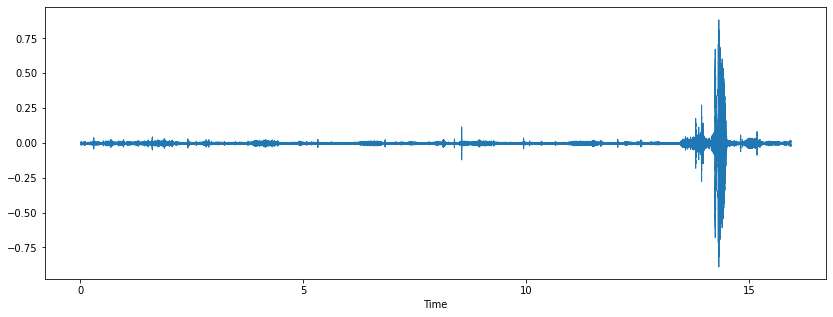

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y)

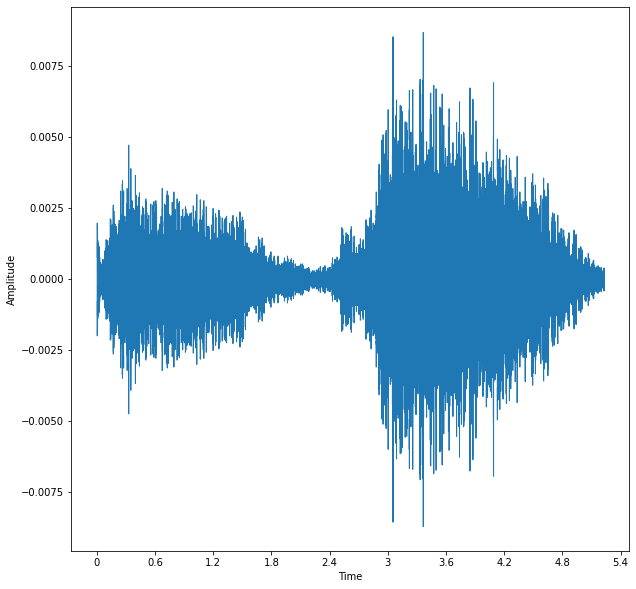

In [ ]:

fig = plt.figure(figsize=(10, 10))
plt.ylabel('Amplitude')
librosa.display.waveshow(audio)
plt.savefig('ciclo.png')

In [ ]:
ipd.Audio(data=y, rate=sr, autoplay=True)

In [ ]:
ipd.Audio(data=audio, rate=sr, autoplay=True)

In [ ]:
df

,filename,label
0,101_1b1_Al_sc_Meditron_0,none
1,101_1b1_Al_sc_Meditron_1,none
2,101_1b1_Al_sc_Meditron_10,none
3,101_1b1_Al_sc_Meditron_11,none
4,101_1b1_Al_sc_Meditron_2,none
...,...,...
6893,226_1b1_Pl_sc_Meditron_5,crackle
6894,226_1b1_Pl_sc_Meditron_6,crackle
6895,226_1b1_Pl_sc_Meditron_7,none
6896,226_1b1_Pl_sc_Meditron_8,none


#### Creazione dataset

In [ ]:
from scipy.signal import butter, lfilter
from scipy.signal import freqz


def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y



In [ ]:
# import threading 
# from threading import * 
import soundfile as sf

def new_dataset_bandPass(df_binary):
  df_bandPass = pd.DataFrame(columns=['filename', 'label'])
  for elem,label in tqdm(zip(df_binary['filename'], df_binary['label']), total=df_binary.shape[0]):
    path = elem.replace('.wav', '_bandPass3.wav')
    path = path.replace('dataset_cicli_respiratori', 'dataset_bandPass3')
    # if path in df_bandPass['filename'].unique():
    #   continue
    # elem2 = "/content/dataset_cicli_respiratori/"+elem+".wav"
    audio, sr = librosa.load(elem)

    # Sample rate and desired cutoff frequencies (in Hz).
    fs = sr
    lowcut = 100.0
    highcut = 500.0

    y = butter_bandpass_filter(audio, lowcut, highcut, fs, order=7)

    sf.write(path, y, sr)
    df_bandPass = df_bandPass.append({'filename':path, 'label': label}, ignore_index=True)
  return df_bandPass

In [ ]:
df_binary = pd.read_csv('/content/drive/MyDrive/Tesi Antonio Gagliostro/Altri esperimenti/df_binary.csv')
df_bandPass = new_dataset_bandPass(df_binary)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


  0%|          | 0/6898 [00:00<?, ?it/s]

In [ ]:
!zip -r /content/drive/MyDrive/Tesi' 'Antonio' 'Gagliostro/Dati/ICBHI/Respiratory' 'cycle' 'dataset/dataset_bandPass2.zip dataset_bandPass2/

In [ ]:
df_bandPass.to_csv(r'/content/drive/MyDrive/Tesi Antonio Gagliostro/Dati/ICBHI/Respiratory cycle dataset/dataset_bandPass2.zip', index=False)

## Creazione dataset ICBHI pathology-driven con filtro passa-banda


In [ ]:
!7z x /content/drive/MyDrive/Tesi/ICBHI_final_database.zip -o/content/


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/Tesi/                                      1 file, 1978998275 bytes (1888 MiB)

Extracting archive: /content/drive/MyDrive/Tesi/ICBHI_final_database.zip
--
Path = /content/drive/MyDrive/Tesi/ICBHI_final_database.zip
Type = zip
Physical Size = 1978998275

  0%      0% 18 - ICBHI_final_database/107_2b3_Ll_mc_AKGC417L.wav                                                           1% 26 - ICBHI_final_database/107_2b4_Ar_mc_AKGC417L.wav                                               

In [ ]:
#c'è un errore su un file del dataset che non è stato rinominato con lo strumento di registrazione giusto

!mv 'ICBHI_final_database'/226_1b1_Pl_sc_LittC2SE.txt 'ICBHI_final_database'/226_1b1_Pl_sc_Meditron.txt
!mv 'ICBHI_final_database'/226_1b1_Pl_sc_LittC2SE.wav 'ICBHI_final_database'/226_1b1_Pl_sc_Meditron.wav

In [ ]:
df_diagnosis = pd.read_csv('/content/drive/MyDrive/Tesi/diagnosis.csv',sep=';', header=None, names=['patient', 'diagnosy'] )
df_diagnosis.iloc[87]

patient      188
diagnosy    URTI
Name: 87, dtype: object

In [ ]:
df_diagnosis.diagnosy.iloc[224-101]

'Healthy'

In [ ]:
tmp='234_sdasda_Da32_asdas'
tmp.split('_')[0]

'234'

In [ ]:
first_id_patient=101
df_pat = pd.DataFrame(columns=['filename', 'label'])

for filename in tqdm(os.listdir('/content/ICBHI_final_database/')):
    if filename.endswith(".wav"):
      id_patient = int(filename.split('_')[0])
      df_pat= df_pat.append({'filename': '/content/ICBHI_final_database/'+filename, 'label': df_diagnosis.diagnosy.iloc[id_patient - first_id_patient]}, ignore_index=True)

df_pat

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/1843 [00:00<?, ?it/s]

,filename,label
0,/content/ICBHI_final_database/172_1b5_Tc_mc_AK...,COPD
1,/content/ICBHI_final_database/162_2b2_Al_mc_AK...,COPD
2,/content/ICBHI_final_database/139_1b1_Ar_sc_Li...,COPD
3,/content/ICBHI_final_database/176_1b3_Al_mc_AK...,COPD
4,/content/ICBHI_final_database/151_3p3_Ll_mc_AK...,COPD
...,...,...
915,/content/ICBHI_final_database/114_1b4_Lr_mc_AK...,COPD
916,/content/ICBHI_final_database/188_1b1_Ar_sc_Me...,URTI
917,/content/ICBHI_final_database/223_1b1_Pr_sc_Me...,COPD
918,/content/ICBHI_final_database/221_2b2_Al_mc_Li...,COPD


In [ ]:
df_pat.to_csv('/content/drive/MyDrive/Tesi/df_pat.csv', index=False)

In [ ]:
df_pat.filename.iloc[0]

'/content/ICBHI_final_database/172_1b5_Tc_mc_AKGC417L.wav'

#### prove

In [ ]:
!pip install torchaudio
import torchaudio

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Tesi/df_pat.csv')
df.head()

,filename,label
0,/content/ICBHI_final_database/172_1b5_Tc_mc_AK...,COPD
1,/content/ICBHI_final_database/162_2b2_Al_mc_AK...,COPD
2,/content/ICBHI_final_database/139_1b1_Ar_sc_Li...,COPD
3,/content/ICBHI_final_database/176_1b3_Al_mc_AK...,COPD
4,/content/ICBHI_final_database/151_3p3_Ll_mc_AK...,COPD


In [ ]:
# path = "/content/dataset_cicli_respiratori/" + df['filename'][300] + ".wav" #1658
audio, sr = librosa.load(df.filename.iloc[39])
ipd.Audio(data=audio, rate=sr, autoplay=True)

In [ ]:
sr

22050

In [ ]:
np.asarray(audio)

array([0.        , 0.        , 0.        , ..., 0.00359949, 0.00292374,
       0.00201758], dtype=float32)

In [ ]:
from scipy.signal import butter, lfilter
from scipy.signal import freqz


def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


# Sample rate and desired cutoff frequencies (in Hz).
fs = sr
lowcut = 120.0
highcut = 1800.0

y = butter_bandpass_filter(audio, lowcut, highcut, fs, order=7)

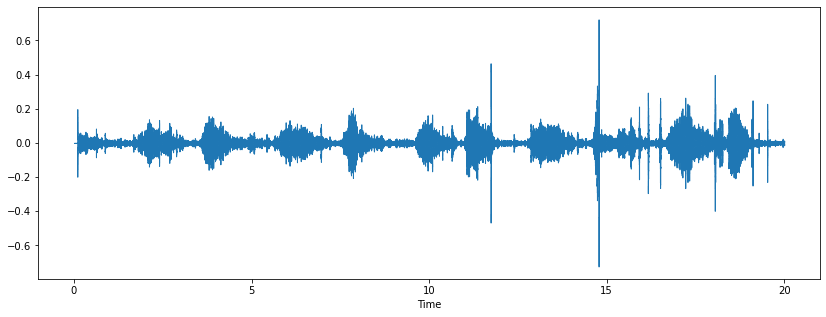

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y)

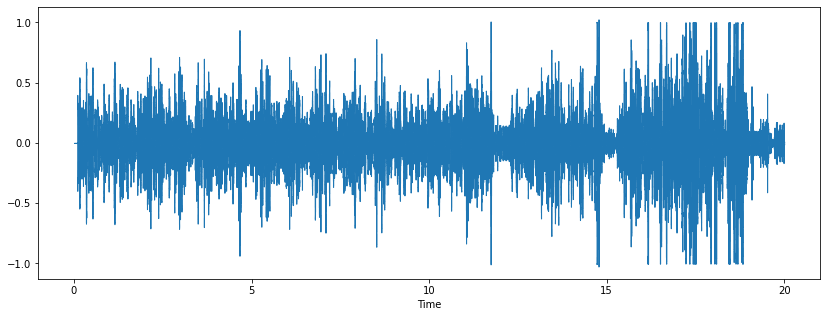

In [ ]:
# fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(audio)

In [ ]:
ipd.Audio(data=y, rate=sr, autoplay=True)

In [ ]:
ipd.Audio(data=audio, rate=sr, autoplay=True)

#### creazione dataset con filtro passa-banda

In [ ]:
from scipy.signal import butter, lfilter
from scipy.signal import freqz


def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y



In [ ]:
# import threading 
# from threading import * 
import soundfile as sf

def new_dataset_bandPass(df_pat):
  df_pat_bandPass2 = pd.DataFrame(columns=['filename', 'label'])
  for elem,label in tqdm(zip(df_pat['filename'], df_pat['label']), total=df_pat.shape[0]):
    path = elem.replace('.wav', '_bandPass2.wav')
    path = path.replace('ICBHI_final_database', 'dataset_pat_bandPass2')
    # if path in df_bandPass['filename'].unique():
    #   continue
    # elem2 = "/content/dataset_cicli_respiratori/"+elem+".wav"
    audio, sr = librosa.load(elem)

    # Sample rate and desired cutoff frequencies (in Hz).
    fs = sr
    lowcut = 120.0
    highcut = 1800.0

    y = butter_bandpass_filter(audio, lowcut, highcut, fs, order=7)

    sf.write(path, y, sr)
    df_pat_bandPass2 = df_pat_bandPass2.append({'filename':path, 'label': label}, ignore_index=True)
  return df_pat_bandPass2

In [ ]:
# df_pat = pd.read_csv('/content/drive/MyDrive/Tesi/df_pat.csv')
df_pat_bandPass = new_dataset_bandPass(df_pat)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


  0%|          | 0/920 [00:00<?, ?it/s]

In [ ]:
!zip -r drive/MyDrive/Tesi/dataset_pat_bandPass2.zip dataset_pat_bandPass2/

  adding: dataset_pat_bandPass2/ (stored 0%)
  adding: dataset_pat_bandPass2/138_1p4_Pr_mc_AKGC417L_bandPass2.wav (deflated 16%)
  adding: dataset_pat_bandPass2/192_2b2_Ar_mc_LittC2SE_bandPass2.wav (deflated 38%)
  adding: dataset_pat_bandPass2/192_2b2_Al_mc_LittC2SE_bandPass2.wav (deflated 49%)
  adding: dataset_pat_bandPass2/132_2b2_Lr_mc_LittC2SE_bandPass2.wav (deflated 65%)
  adding: dataset_pat_bandPass2/221_2b1_Ar_mc_LittC2SE_bandPass2.wav (deflated 36%)
  adding: dataset_pat_bandPass2/130_3p4_Pr_mc_AKGC417L_bandPass2.wav (deflated 22%)
  adding: dataset_pat_bandPass2/177_2b4_Lr_mc_AKGC417L_bandPass2.wav (deflated 24%)
  adding: dataset_pat_bandPass2/176_2b3_Ll_mc_AKGC417L_bandPass2.wav (deflated 27%)
  adding: dataset_pat_bandPass2/147_1b3_Tc_mc_AKGC417L_bandPass2.wav (deflated 12%)
  adding: dataset_pat_bandPass2/200_2p3_Tc_mc_AKGC417L_bandPass2.wav (deflated 23%)
  adding: dataset_pat_bandPass2/186_3b3_Al_mc_AKGC417L_bandPass2.wav (deflated 28%)
  adding: dataset_pat_bandPass2

In [ ]:
df_pat_bandPass.to_csv(r'/content/drive/MyDrive/Tesi/dataset_pat_bandPass2.csv', index=False)

## Final dataset anomaly 80% (train) - 20% (test)

In [ ]:
df_rc = pd.read_csv("/content/drive/MyDrive/Tesi/dataset_rc.csv")
train_rc, test_rc = train_test_split(df_rc, test_size=0.2, random_state=33)#, stratify=df["label"])
# train_rc = train_rc.reset_index(drop=True)
# test_rc = test_rc.reset_index(drop=True)
print(train_rc.shape)
print(test_rc.shape)

(5518, 2)
(1380, 2)


In [ ]:
train_rc

,filename,label
5305,194_1b1_Pr_sc_Meditron_7,none
558,113_1b1_Ar_sc_Litt3200_2,none
6254,211_1p2_Pr_mc_AKGC417L_11,none
785,120_1b1_Lr_sc_Meditron_26,none
5798,203_1p4_Pr_mc_AKGC417L_0,none
...,...,...
3273,158_1p4_Tc_mc_AKGC417L_8,none
2706,154_1b3_Ll_mc_AKGC417L_0,crackle
578,113_1b1_Lr_sc_Litt3200_3,none
5848,204_2b5_Al_mc_AKGC417L_2,wheeze


In [ ]:
train_rc.to_csv('/content/drive/MyDrive/Tesi/train_rc.csv' , index=False)
test_rc.to_csv('/content/drive/MyDrive/Tesi/test_rc.csv', index=False)

In [ ]:
tmp=pd.read_csv('/content/drive/MyDrive/Tesi/test_rc.csv')
tmp

,filename\tlabel
0,157_1b1_Pr_sc_Meditron_2\tcrackle
1,130_2b2_Al_mc_AKGC417L_5\tcrackle
2,210_1b1_Ar_sc_Meditron_10\tnone
3,163_8b3_Ll_mc_AKGC417L_3\tnone
4,178_1b6_Pl_mc_AKGC417L_6\tnone
...,...
1375,147_1b2_Tc_mc_AKGC417L_6\tnone
1376,192_2b2_Al_mc_LittC2SE_3\tboth
1377,130_1p2_Pl_mc_AKGC417L_3\tcrackle
1378,200_2p3_Pr_mc_AKGC417L_2\tnone


## Final dataset pathology 80% (train) - 20% (test)

In [ ]:
df_pathology = pd.read_csv("/content/drive/MyDrive/Tesi/dataset_pat_bandPass2.csv")

In [ ]:
df_binary = df_pathology.copy()
df_binary['label'] = (df_binary['label'] =='Healthy')*1
df_binary

,filename,label
0,/content/dataset_pat_bandPass2/172_1b5_Tc_mc_A...,0
1,/content/dataset_pat_bandPass2/162_2b2_Al_mc_A...,0
2,/content/dataset_pat_bandPass2/139_1b1_Ar_sc_L...,0
3,/content/dataset_pat_bandPass2/176_1b3_Al_mc_A...,0
4,/content/dataset_pat_bandPass2/151_3p3_Ll_mc_A...,0
...,...,...
915,/content/dataset_pat_bandPass2/114_1b4_Lr_mc_A...,0
916,/content/dataset_pat_bandPass2/188_1b1_Ar_sc_M...,0
917,/content/dataset_pat_bandPass2/223_1b1_Pr_sc_M...,0
918,/content/dataset_pat_bandPass2/221_2b2_Al_mc_L...,0


In [ ]:
train_binary_pathology, test_binary_pathology = train_test_split(df_binary, test_size=0.2, random_state=33)
print(train_binary_pathology.shape)
print(test_binary_pathology.shape)

(736, 2)
(184, 2)


In [ ]:
train_binary_pathology.head()

,filename,label
520,/content/dataset_pat_bandPass2/205_1b3_Ar_mc_A...,0
664,/content/dataset_pat_bandPass2/151_3p2_Al_mc_A...,0
846,/content/dataset_pat_bandPass2/226_1b1_Ll_sc_M...,0
366,/content/dataset_pat_bandPass2/130_3p2_Pl_mc_A...,0
162,/content/dataset_pat_bandPass2/135_2b2_Al_mc_L...,0


In [ ]:
train_binary_pathology.groupby('label').count()

,filename
label,
0,711
1,25


In [ ]:
test_binary_pathology.groupby('label').count()

,filename
label,
0,174
1,10


In [ ]:
train_binary_pathology.to_csv('/content/drive/MyDrive/Tesi/train_binary_pathology.csv' , index=False)
test_binary_pathology.to_csv('/content/drive/MyDrive/Tesi/test_binary_pathology.csv', index=False)

-----------------

In [ ]:
df_multiclass = df_pathology.copy()
# df_binary['label'] = (df_rc['label']!= ('crackle' or 'wheeze' or 'both'))*1
#0:HEALTHY, 1:CHRONIC, 2:NON-CHRONIC
df_multiclass.loc[df_multiclass.label == "Healthy", "label"] = 0

df_multiclass.loc[df_multiclass.label == "COPD", "label"] = 1
df_multiclass.loc[df_multiclass.label == "Bronchiectasis", "label"] = 1
df_multiclass.loc[df_multiclass.label == "Asthma", "label"] = 1

df_multiclass.loc[df_multiclass.label == "LRTI", "label"] = 2
df_multiclass.loc[df_multiclass.label == "URTI", "label"] = 2
df_multiclass.loc[df_multiclass.label == "Pneumonia", "label"] = 2
df_multiclass.loc[df_multiclass.label == "Bronchiolitis", "label"] = 2
df_multiclass

,filename,label
0,/content/dataset_pat_bandPass2/172_1b5_Tc_mc_A...,1
1,/content/dataset_pat_bandPass2/162_2b2_Al_mc_A...,1
2,/content/dataset_pat_bandPass2/139_1b1_Ar_sc_L...,1
3,/content/dataset_pat_bandPass2/176_1b3_Al_mc_A...,1
4,/content/dataset_pat_bandPass2/151_3p3_Ll_mc_A...,1
...,...,...
915,/content/dataset_pat_bandPass2/114_1b4_Lr_mc_A...,1
916,/content/dataset_pat_bandPass2/188_1b1_Ar_sc_M...,2
917,/content/dataset_pat_bandPass2/223_1b1_Pr_sc_M...,1
918,/content/dataset_pat_bandPass2/221_2b2_Al_mc_L...,1


In [ ]:
train_multiclass_pathology, test_multiclass_pathology = train_test_split(df_multiclass, test_size=0.2, random_state=33)#, stratify=df["label"])
# train_rc = train_rc.reset_index(drop=True)
# test_rc = test_rc.reset_index(drop=True)
print(train_multiclass_pathology.shape)
print(test_multiclass_pathology.shape)

(736, 2)
(184, 2)


In [ ]:
train_multiclass_pathology.head()

,filename,label
520,/content/dataset_pat_bandPass2/205_1b3_Ar_mc_A...,1
664,/content/dataset_pat_bandPass2/151_3p2_Al_mc_A...,1
846,/content/dataset_pat_bandPass2/226_1b1_Ll_sc_M...,2
366,/content/dataset_pat_bandPass2/130_3p2_Pl_mc_A...,1
162,/content/dataset_pat_bandPass2/135_2b2_Al_mc_L...,2


In [ ]:
train_multiclass_pathology.groupby('label').count()

,filename
label,
0,25
1,648
2,63


In [ ]:
test_multiclass_pathology.groupby('label').count()

,filename
label,
0,10
1,162
2,12


In [ ]:
train_multiclass_pathology.to_csv('/content/drive/MyDrive/Tesi/train_multiclass_pathology.csv' , index=False)
test_multiclass_pathology.to_csv('/content/drive/MyDrive/Tesi/test_multiclass_pathology.csv', index=False)

In [ ]:
tmp=pd.read_csv('/content/drive/MyDrive/Tesi/test_rc.csv')
tmp

,filename\tlabel
0,157_1b1_Pr_sc_Meditron_2\tcrackle
1,130_2b2_Al_mc_AKGC417L_5\tcrackle
2,210_1b1_Ar_sc_Meditron_10\tnone
3,163_8b3_Ll_mc_AKGC417L_3\tnone
4,178_1b6_Pl_mc_AKGC417L_6\tnone
...,...
1375,147_1b2_Tc_mc_AKGC417L_6\tnone
1376,192_2b2_Al_mc_LittC2SE_3\tboth
1377,130_1p2_Pl_mc_AKGC417L_3\tcrackle
1378,200_2p3_Pr_mc_AKGC417L_2\tnone
